In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream')

In [4]:
traces = {}
for trace in ['a']:
    traces[trace] = [np.load('earm_mtdreamz_3chain_flat_2his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamz_3chain_flat_2his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a']:
    logps[trace] = [np.load('earm_mtdreamz_3chain_flat_2his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamz_3chain_flat_2his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-583.42652222]
 [-190.1551182 ]
 [ -57.76013971]
 [ -57.76013971]
 [ -57.76013971]
 [ -57.76013971]
 [  28.8520599 ]
 [ 139.41910366]
 [ 139.41910366]
 [ 139.41910366]
 [ 139.41910366]
 [ 139.41910366]
 [ 139.41910366]
 [ 139.41910366]
 [ 143.82426129]
 [ 143.82426129]
 [ 143.82426129]
 [ 142.42124484]
 [ 142.42124484]
 [ 142.42124484]
 [ 170.42373296]
 [ 176.74784114]
 [ 176.74784114]
 [ 290.10723026]
 [ 290.10723026]
 [ 290.10723026]
 [ 290.10723026]
 [ 290.10723026]
 [ 290.10723026]
 [ 290.10723026]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 292.64812374]
 [ 297.96000898]
 [ 297.96000898]
 [ 297.96000898]
 [ 297.96000898]
 [ 297.96000898]
 [ 311.44930975]
 [ 311.44930975]
 [ 315.68733029]
 [ 315.68733029]
 [ 315.68733029]
 [ 315.68733029]


In [6]:
traces['a'][0][:,72]

array([-1.22085777, -1.38978048, -1.07798947, -1.07798947, -1.07798947,
       -1.07798947, -1.30739342, -1.00429801, -1.00429801, -1.00429801,
       -1.00429801, -1.00429801, -1.00429801, -1.00429801, -1.19562408,
       -1.19562408, -1.19562408, -1.19562408, -1.19562408, -1.19562408,
       -1.10464082, -0.91524592, -0.91524592, -0.80867849, -0.80867849,
       -0.80867849, -0.80867849, -0.80867849, -0.80867849, -0.80867849,
       -0.80867849, -0.80867849, -0.80867849, -0.80867849, -0.80867849,
       -0.80867849, -0.80867849, -0.80867849, -0.80867849, -0.80867849,
       -0.80867849, -0.80867849, -0.80867849, -0.80867849, -0.80867849,
       -0.80867849, -0.8473534 , -0.8473534 , -0.8473534 , -0.8473534 ,
       -0.8473534 , -1.14955078, -1.14955078, -1.0301116 , -1.0301116 ,
       -1.0301116 , -1.0301116 , -1.0301116 , -1.0301116 , -1.0301116 ,
       -1.0301116 , -1.0301116 , -1.0301116 , -1.0301116 , -1.0301116 ,
       -1.19999046, -1.24541502, -1.24541502, -1.24541502, -1.24

In [10]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  18  of  105  parameters.
Percent of parameters with GR below 1.2:  17.1428571429
Number of parameters with GR below 1.1:  8  of  105  parameters.
Percent of parameters with GR below 1.1:  7.61904761905


[18, 17.142857142857142, 8, 7.6190476190476195]

1000
3
1000


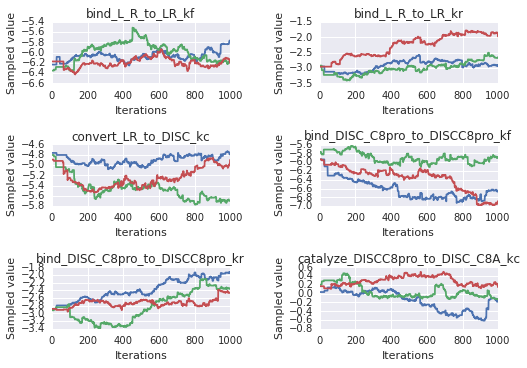

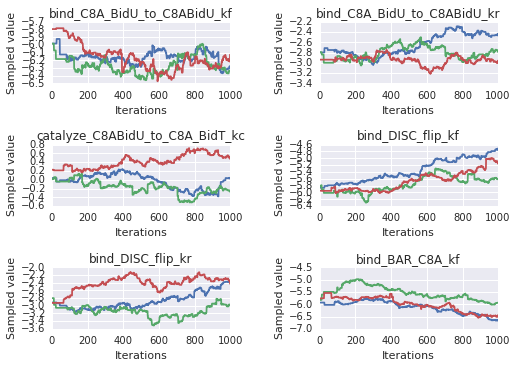

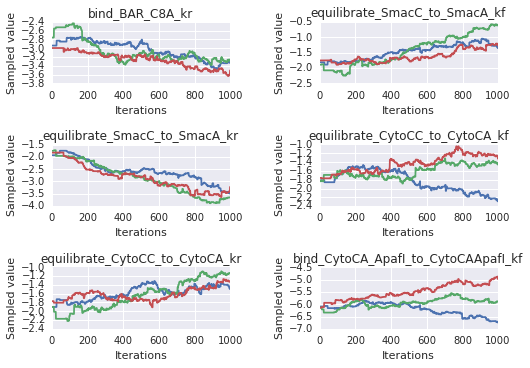

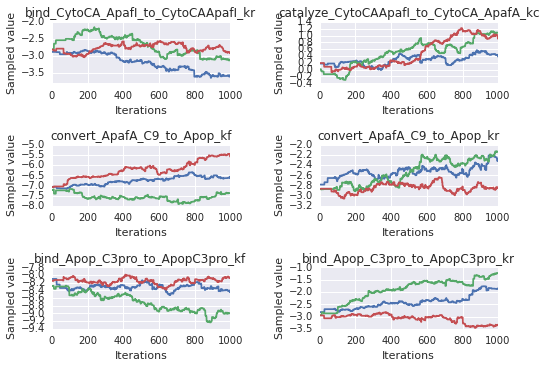

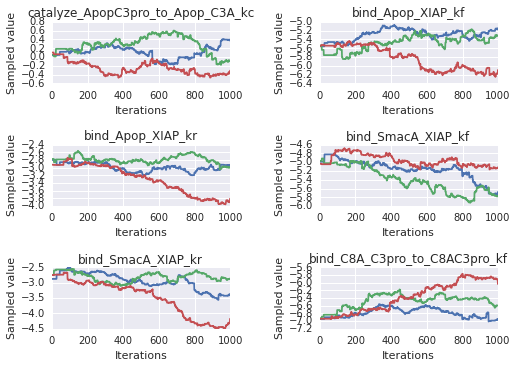

...

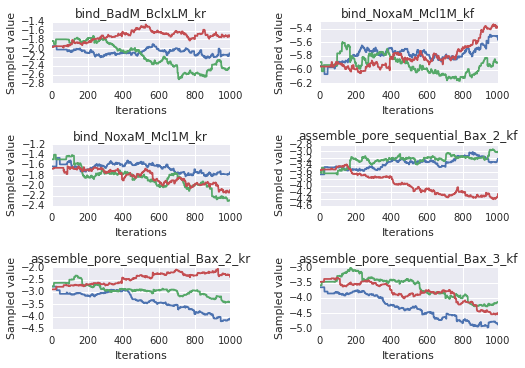

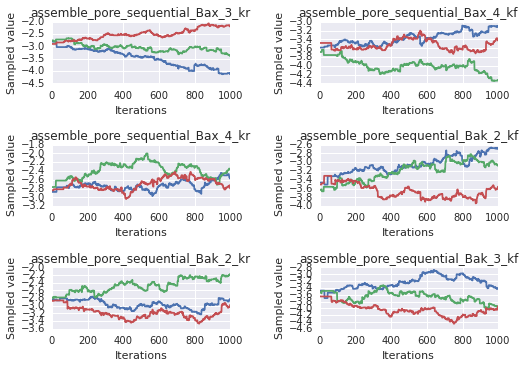

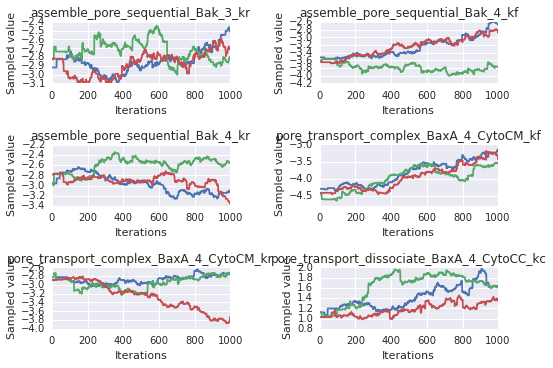

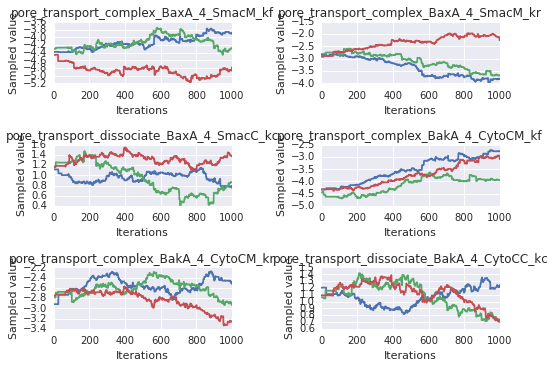

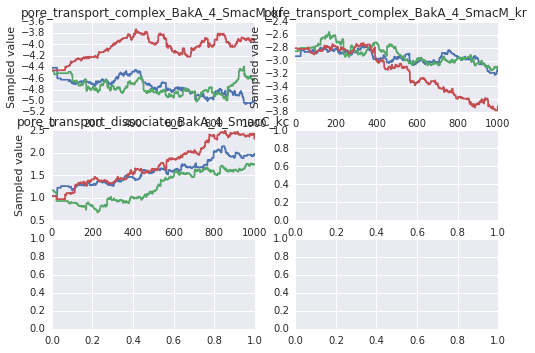

In [10]:
sample_plots(param_trace_dicts['a'])

In [9]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=600, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


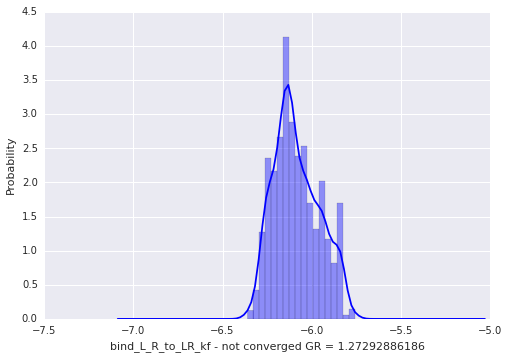

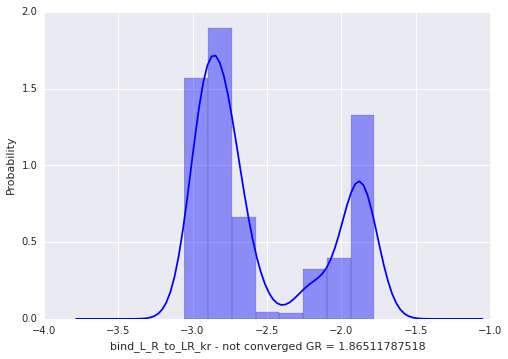

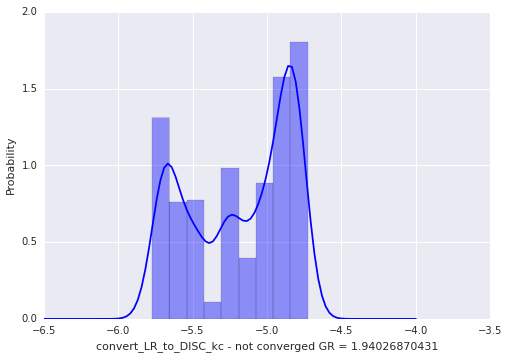

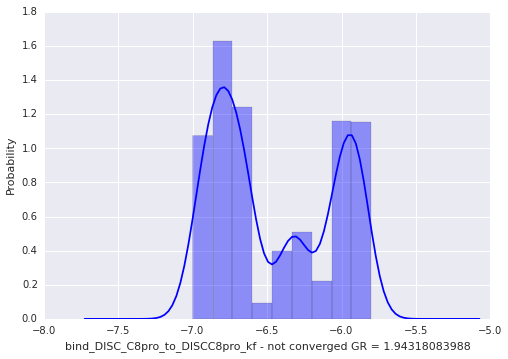

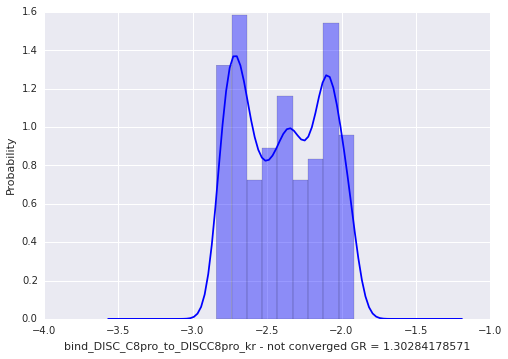

...

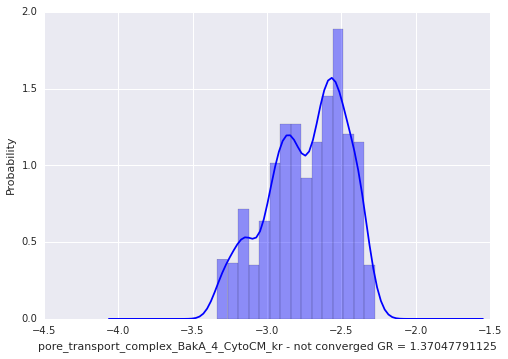

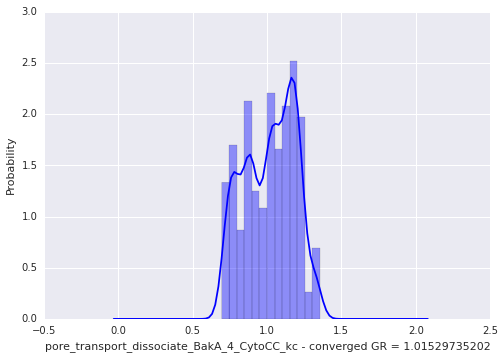

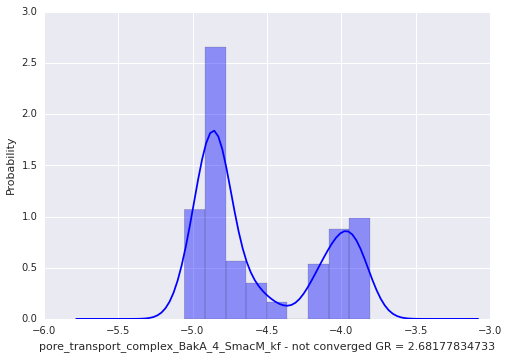

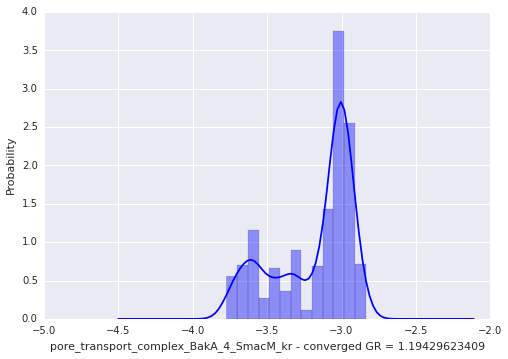

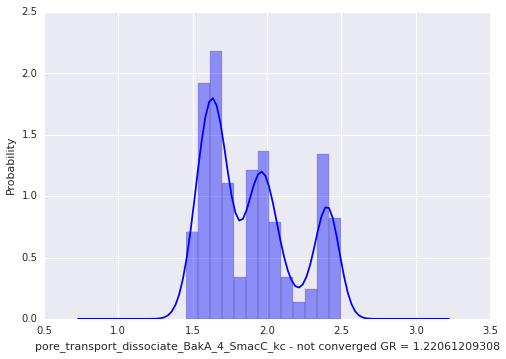

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [11]:
traces['a'][1][:,0]

array([-6.3777359 , -6.50436472, -6.50436472, -6.50436472, -6.50436472,
       -6.50436472, -6.50436472, -6.50436472, -6.50436472, -6.50436472,
       -6.50436472, -6.26057645, -6.26057645, -6.26057645, -6.26057645,
       -6.26057645, -6.26057645, -6.18256788, -6.18256788, -6.18256788,
       -6.18256788, -6.18256788, -6.18256788, -6.18256788, -6.18256788,
       -6.18256788, -6.18256788, -6.18256788, -6.18256788, -6.18256788,
       -6.18256788, -6.18256788, -6.18256788, -6.18256788, -6.18256788,
       -6.18256788, -6.18256788, -6.18256788, -6.18256788, -6.18256788,
       -5.984264  , -5.984264  , -5.984264  , -6.17258562, -6.17258562,
       -6.17258562, -6.17258562, -5.99528495, -5.99528495, -5.99528495,
       -5.99528495, -5.99528495, -5.99528495, -5.82202241, -5.82202241,
       -5.82202241, -5.82202241, -5.82202241, -5.82202241, -5.82202241,
       -5.82202241, -5.82202241, -5.82202241, -5.82202241, -5.82202241,
       -5.82202241, -5.82202241, -5.82202241, -5.74616385, -5.67

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

1000
3
1000


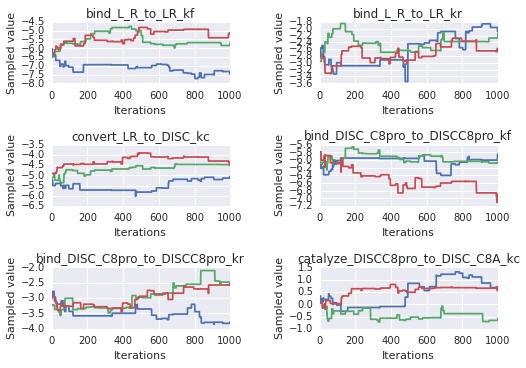

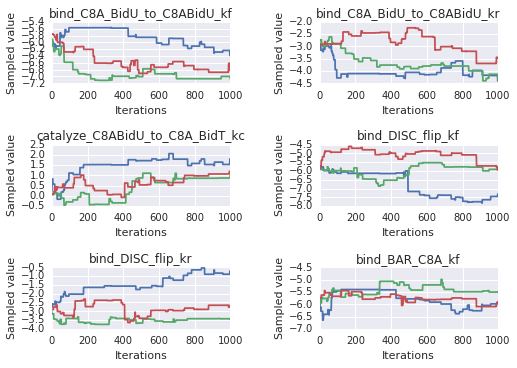

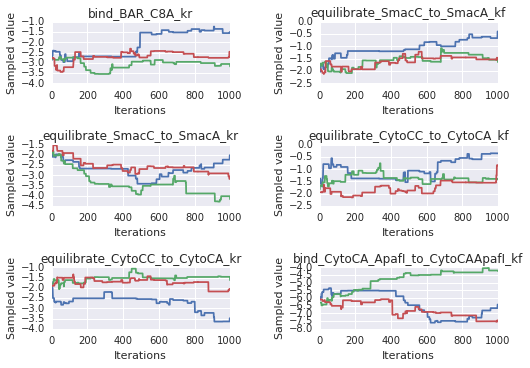

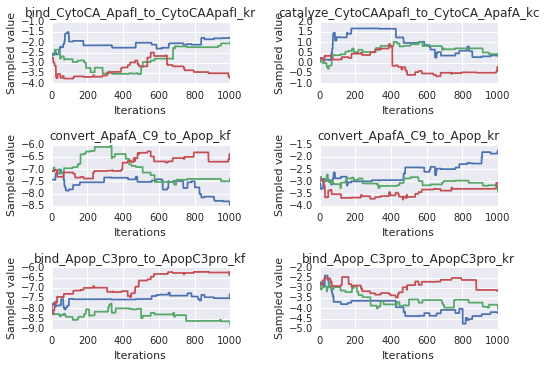

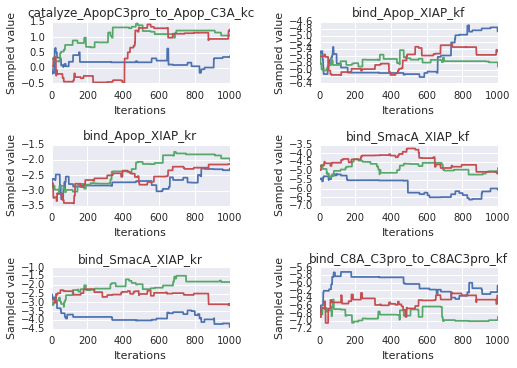

...

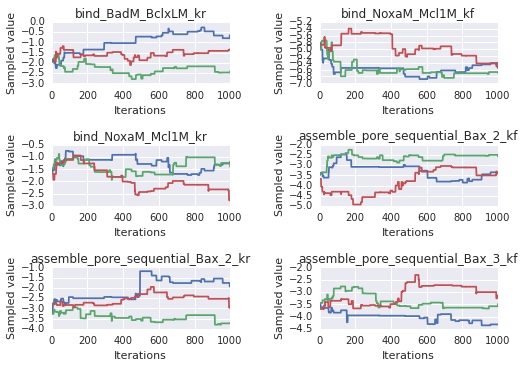

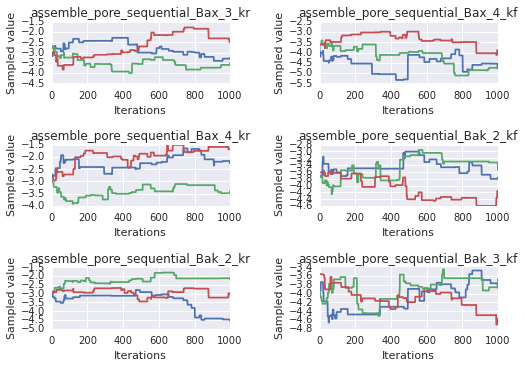

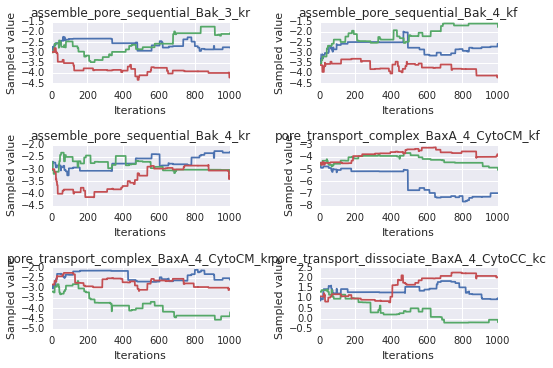

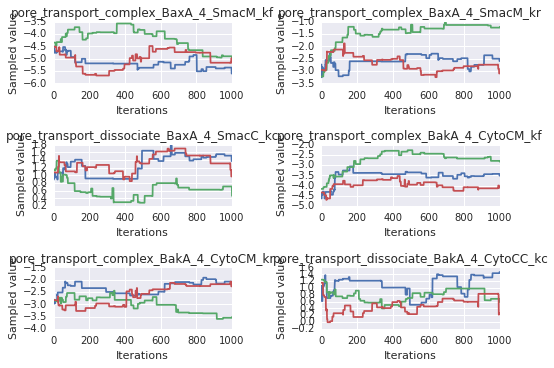

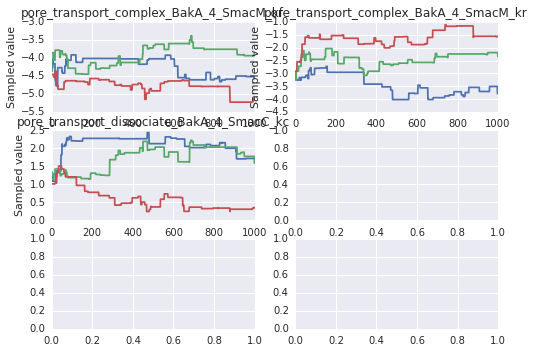

In [8]:
sample_plots(param_trace_dicts['a'])

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


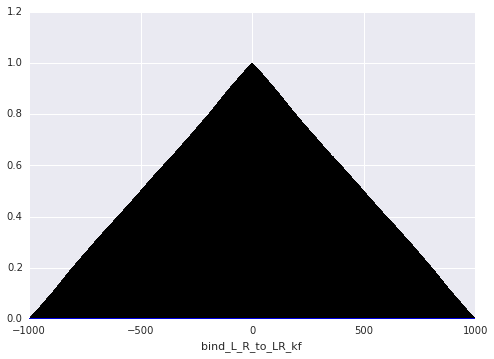

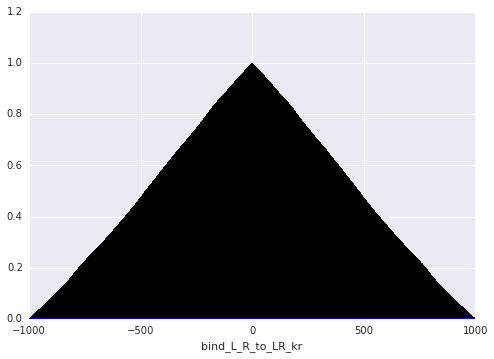

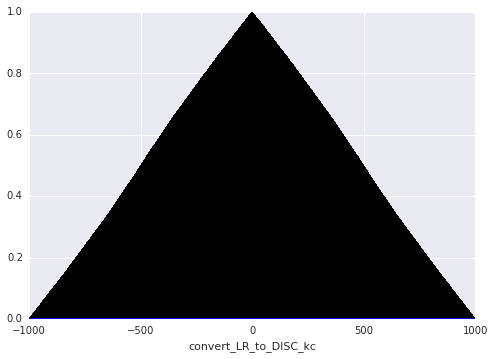

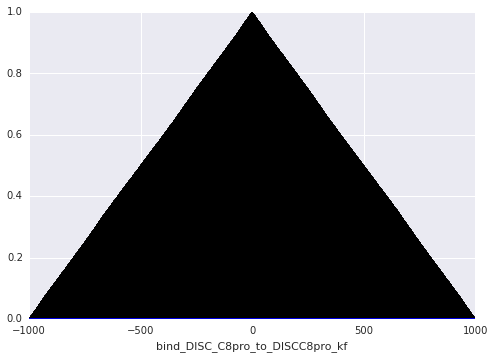

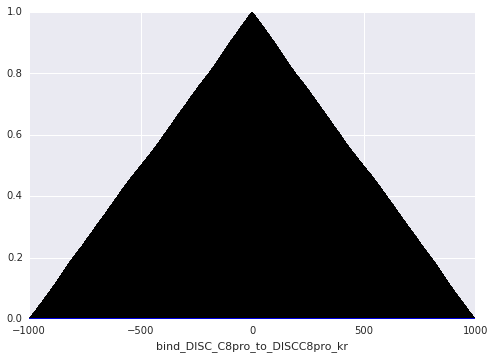

...

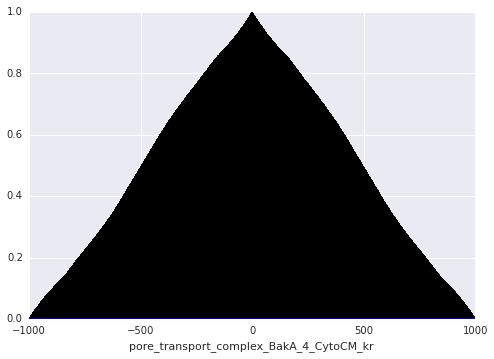

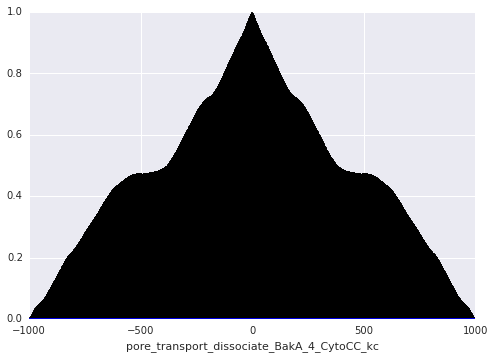

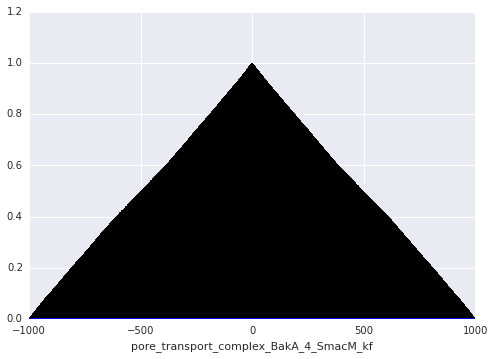

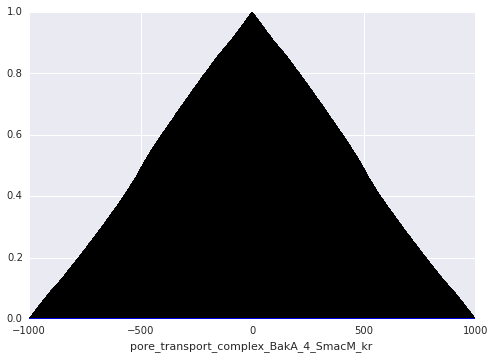

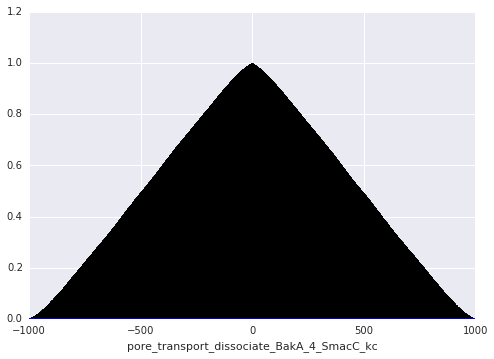

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

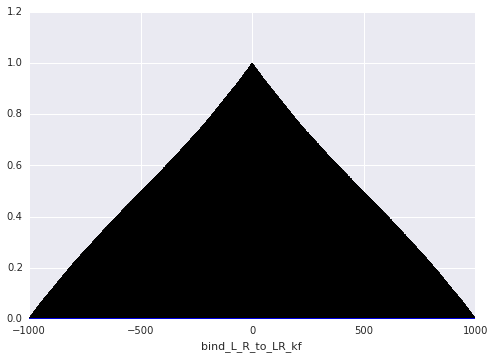

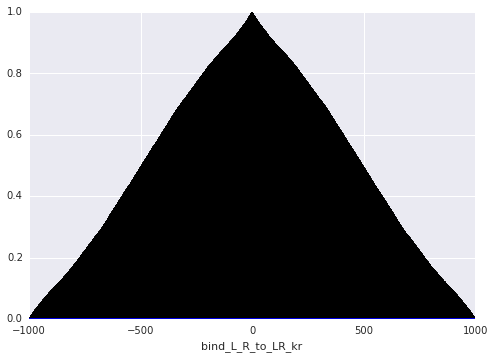

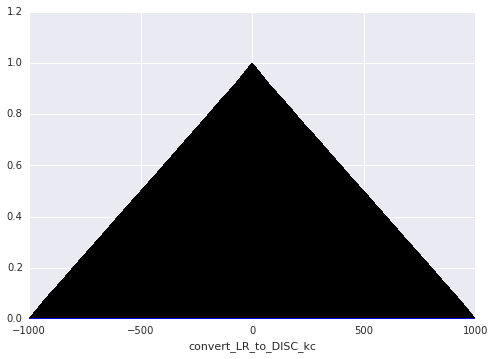

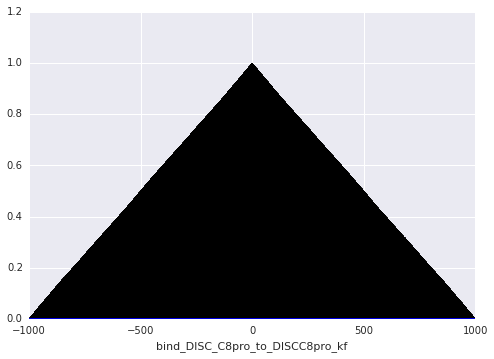

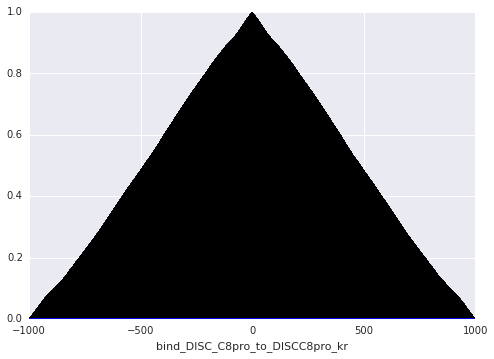

...

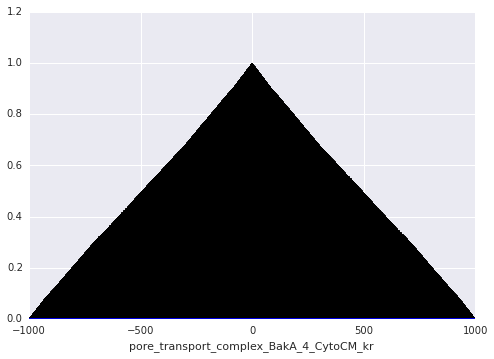

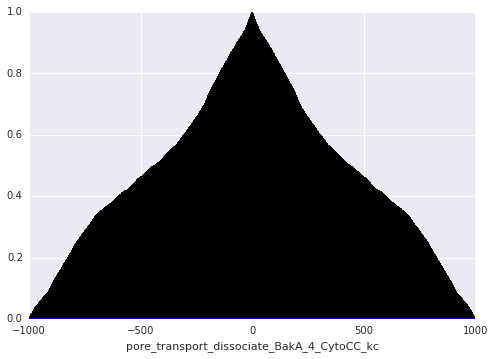

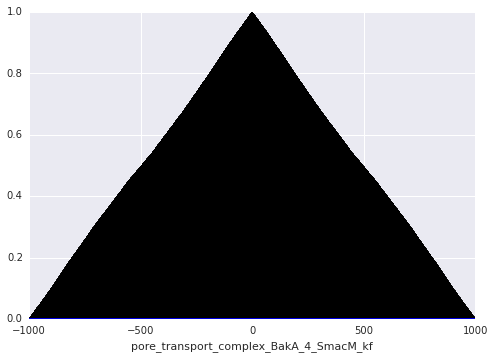

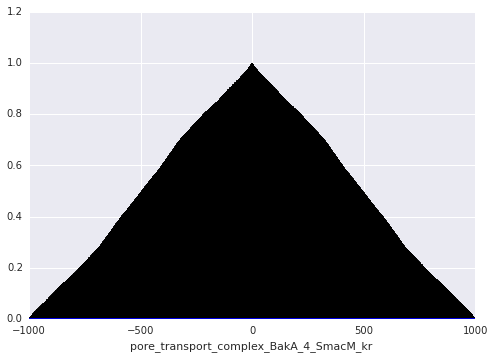

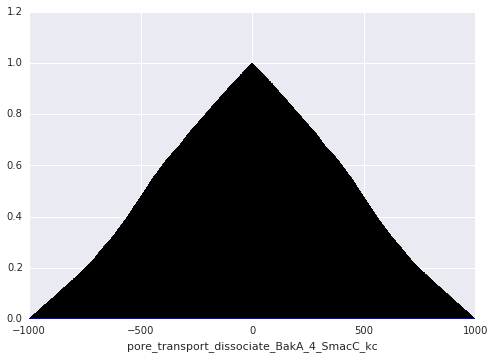

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

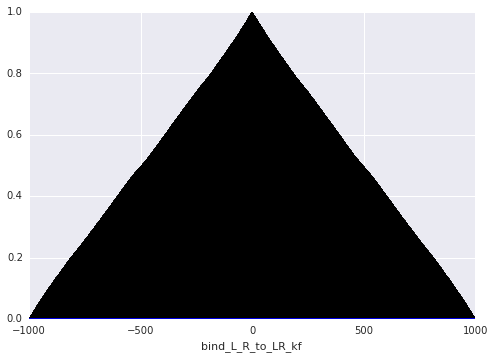

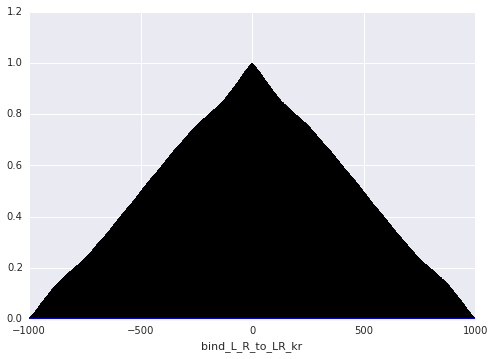

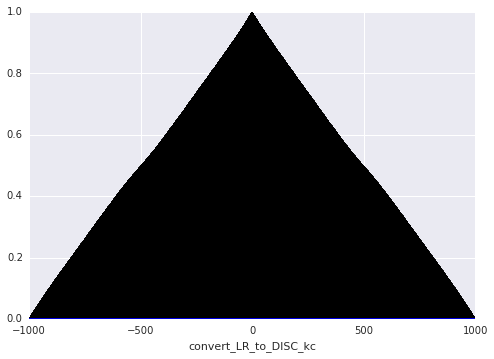

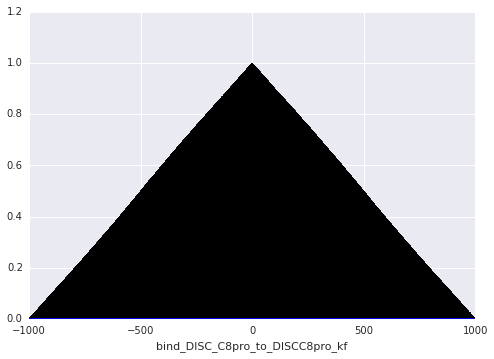

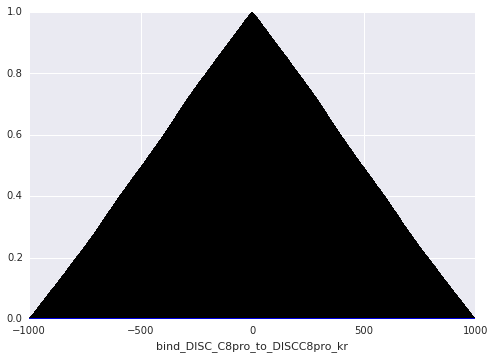

...

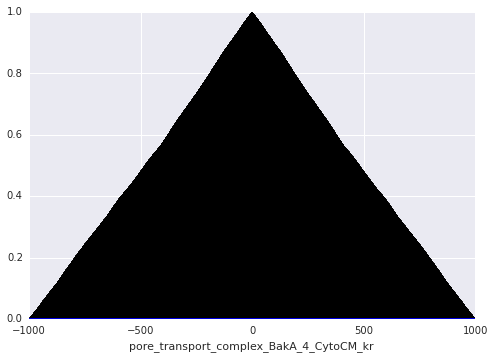

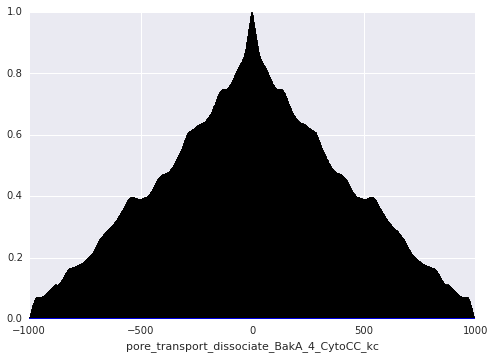

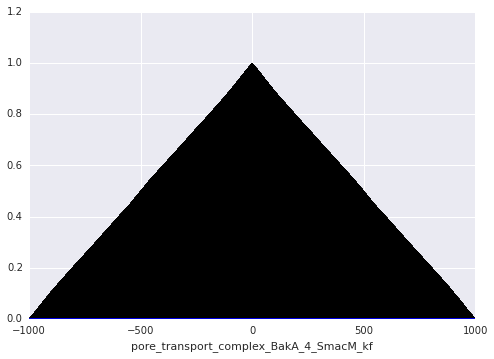

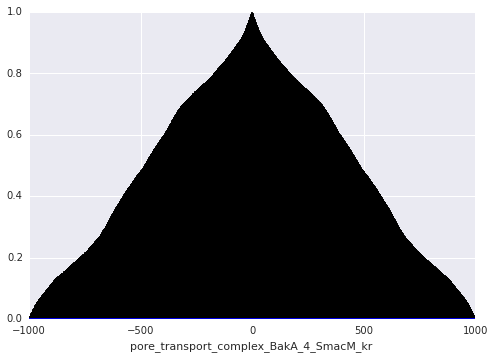

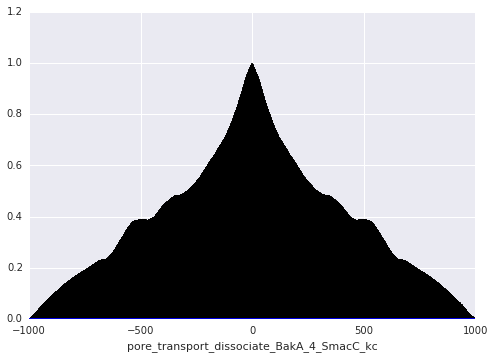

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

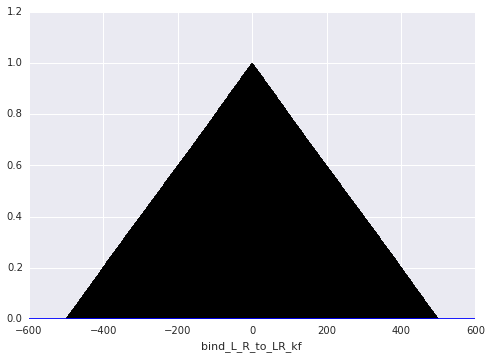

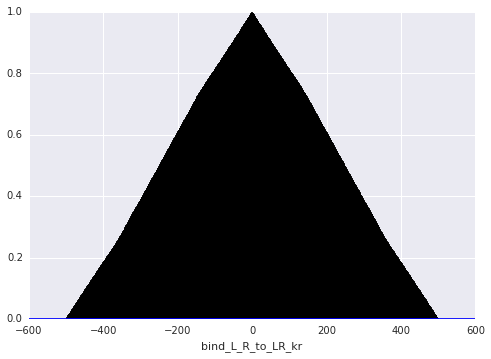

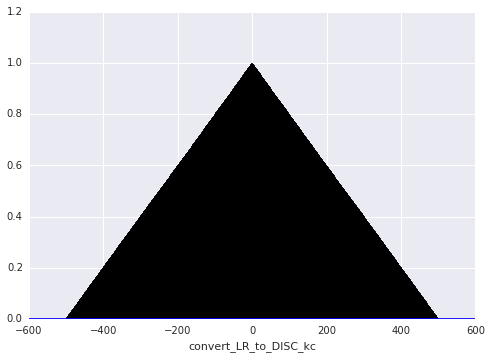

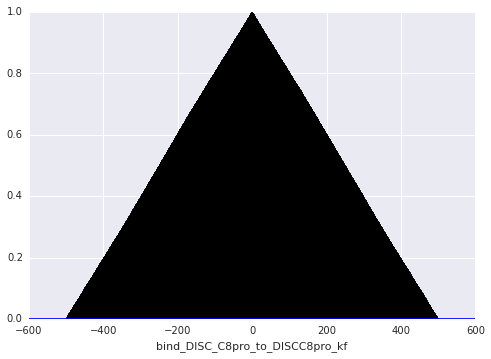

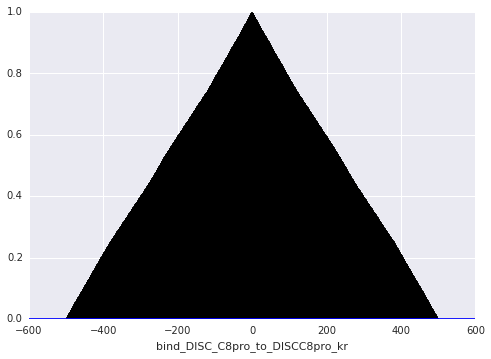

...

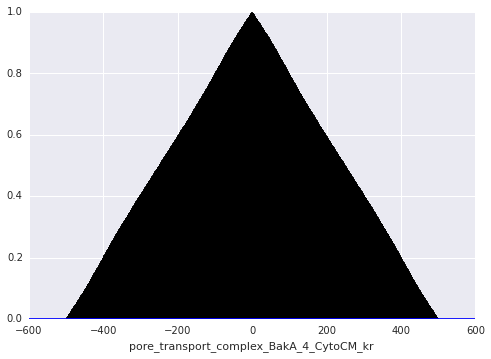

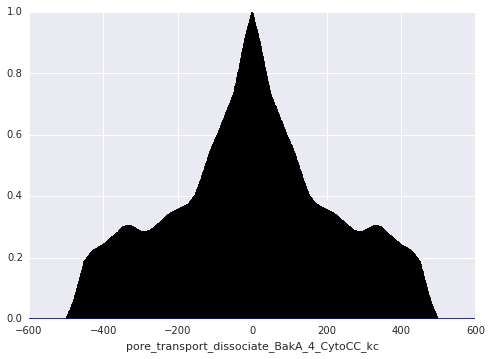

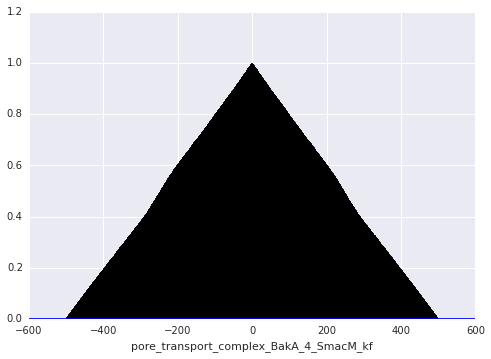

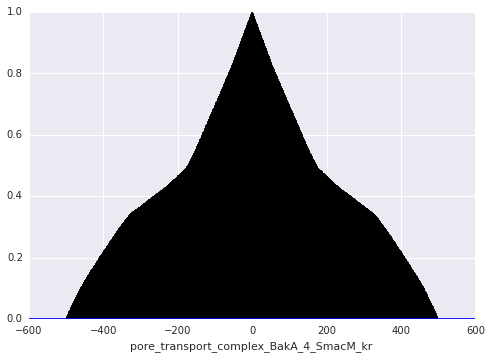

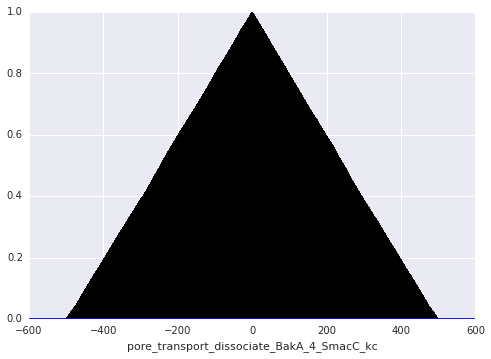

In [11]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][500:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [17]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  49  acceptance rate:  0.049
N acceptances for parameter:  bind_L_R_to_LR_kr  =  48  acceptance rate:  0.048
N acceptances for parameter:  convert_LR_to_DISC_kc  =  42  acceptance rate:  0.042
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  42  acceptance rate:  0.042
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  48  acceptance rate:  0.048
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  45  acceptance rate:  0.045
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  44  acceptance rate:  0.044
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  46  acceptance rate:  0.046
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  47  acceptance rate:  0.047
N acceptances for parameter:  bind_DISC_flip_kf  =  51  acceptance rate:  0.051
N acceptances for parameter:  bind_DISC_flip_kr  =  46  acceptance rate:  0.046
N acceptances for parameter:  bind_BAR

array([ 0.049,  0.048,  0.042,  0.042,  0.048,  0.045,  0.044,  0.046,
        0.047,  0.051,  0.046,  0.044,  0.045,  0.046,  0.046,  0.053,
        0.049,  0.051,  0.045,  0.052,  0.05 ,  0.048,  0.047,  0.05 ,
        0.046,  0.046,  0.046,  0.05 ,  0.048,  0.042,  0.046,  0.047,
        0.04 ,  0.044,  0.05 ,  0.042,  0.043,  0.045,  0.044,  0.049,
        0.047,  0.041,  0.045,  0.047,  0.045,  0.042,  0.048,  0.044,
        0.045,  0.047,  0.045,  0.05 ,  0.042,  0.049,  0.049,  0.049,
        0.047,  0.05 ,  0.05 ,  0.051,  0.049,  0.053,  0.047,  0.046,
        0.047,  0.05 ,  0.046,  0.047,  0.049,  0.053,  0.052,  0.049,
        0.048,  0.045,  0.045,  0.045,  0.05 ,  0.047,  0.046,  0.043,
        0.052,  0.045,  0.047,  0.043,  0.047,  0.046,  0.047,  0.042,
        0.046,  0.048,  0.049,  0.047,  0.043,  0.047,  0.046,  0.045,
        0.048,  0.049,  0.044,  0.049,  0.046,  0.055,  0.048,  0.05 ,
        0.042])

In [18]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  48  acceptance rate:  0.048
N acceptances for parameter:  bind_L_R_to_LR_kr  =  46  acceptance rate:  0.046
N acceptances for parameter:  convert_LR_to_DISC_kc  =  42  acceptance rate:  0.042
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  48  acceptance rate:  0.048
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  54  acceptance rate:  0.054
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  50  acceptance rate:  0.05
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  45  acceptance rate:  0.045
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  49  acceptance rate:  0.049
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  48  acceptance rate:  0.048
N acceptances for parameter:  bind_DISC_flip_kf  =  52  acceptance rate:  0.052
N acceptances for parameter:  bind_DISC_flip_kr  =  50  acceptance rate:  0.05
N acceptances for parameter:  bind_BAR_C

array([ 0.048,  0.046,  0.042,  0.048,  0.054,  0.05 ,  0.045,  0.049,
        0.048,  0.052,  0.05 ,  0.051,  0.051,  0.053,  0.05 ,  0.052,
        0.045,  0.052,  0.047,  0.048,  0.046,  0.049,  0.053,  0.052,
        0.044,  0.047,  0.049,  0.055,  0.053,  0.045,  0.052,  0.052,
        0.048,  0.051,  0.05 ,  0.05 ,  0.054,  0.054,  0.051,  0.05 ,
        0.05 ,  0.045,  0.053,  0.055,  0.049,  0.05 ,  0.056,  0.054,
        0.053,  0.054,  0.051,  0.048,  0.048,  0.05 ,  0.055,  0.051,
        0.055,  0.051,  0.05 ,  0.047,  0.051,  0.056,  0.05 ,  0.051,
        0.048,  0.048,  0.053,  0.05 ,  0.049,  0.051,  0.053,  0.05 ,
        0.048,  0.051,  0.051,  0.048,  0.055,  0.047,  0.048,  0.051,
        0.051,  0.048,  0.05 ,  0.051,  0.05 ,  0.049,  0.052,  0.05 ,
        0.048,  0.05 ,  0.051,  0.055,  0.052,  0.048,  0.048,  0.052,
        0.05 ,  0.049,  0.048,  0.045,  0.047,  0.048,  0.053,  0.054,
        0.052])

In [19]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  50  acceptance rate:  0.05
N acceptances for parameter:  bind_L_R_to_LR_kr  =  47  acceptance rate:  0.047
N acceptances for parameter:  convert_LR_to_DISC_kc  =  42  acceptance rate:  0.042
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  47  acceptance rate:  0.047
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  45  acceptance rate:  0.045
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  46  acceptance rate:  0.046
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  51  acceptance rate:  0.051
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  46  acceptance rate:  0.046
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  48  acceptance rate:  0.048
N acceptances for parameter:  bind_DISC_flip_kf  =  45  acceptance rate:  0.045
N acceptances for parameter:  bind_DISC_flip_kr  =  51  acceptance rate:  0.051
N acceptances for parameter:  bind_BAR_

array([ 0.05 ,  0.047,  0.042,  0.047,  0.045,  0.046,  0.051,  0.046,
        0.048,  0.045,  0.051,  0.046,  0.05 ,  0.048,  0.045,  0.049,
        0.051,  0.046,  0.048,  0.048,  0.05 ,  0.045,  0.049,  0.048,
        0.052,  0.043,  0.049,  0.048,  0.05 ,  0.05 ,  0.05 ,  0.047,
        0.05 ,  0.048,  0.05 ,  0.045,  0.045,  0.046,  0.049,  0.049,
        0.046,  0.043,  0.045,  0.047,  0.047,  0.044,  0.047,  0.05 ,
        0.049,  0.052,  0.052,  0.048,  0.044,  0.05 ,  0.048,  0.049,
        0.053,  0.049,  0.051,  0.043,  0.045,  0.043,  0.048,  0.045,
        0.049,  0.049,  0.047,  0.049,  0.048,  0.049,  0.048,  0.044,
        0.046,  0.046,  0.047,  0.044,  0.049,  0.047,  0.052,  0.044,
        0.051,  0.052,  0.048,  0.049,  0.046,  0.046,  0.051,  0.044,
        0.045,  0.045,  0.048,  0.047,  0.048,  0.049,  0.047,  0.047,
        0.047,  0.05 ,  0.049,  0.049,  0.049,  0.053,  0.052,  0.047,
        0.05 ])